In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
from scipy.stats import boxcox
from dataprep.eda import *
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing
from sklearn import metrics
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical, normalize
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix  
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score
import cv2
import os
import pymongo
# import fiftyone as fo
import glob
import warnings
warnings.filterwarnings("ignore")
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)
tf.debugging.set_log_device_placement(True)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Num CPUs Available: ", len(tf.config.list_physical_devices('CPU')))
print(tf.config.list_physical_devices())


1 Physical GPUs, 1 Logical GPUs
Num GPUs Available:  1
Num CPUs Available:  1
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


Import dataset

In [2]:
import glob 
from PIL import Image 
from pathlib import Path


file_dir = Path('../ASLTransalation/fingerspelling/data/*')
data_dict = {}
for directory in glob.glob(os.path.abspath(file_dir)):       #os.path.abspath converts the path into byte format 
    images = []
    for files in glob.glob(directory+'/*.png'):
        images.append(files)
    data_dict.setdefault(directory[-1], images)

In [8]:
images = []
labels = []
for k,v in data_dict.items():
        for file in v:
            images.append(file)
            labels.append(k)

In [35]:
data_list = list(zip(images,labels))
data_df = pd.DataFrame(data_list, columns = ['Image', 'Label'])
data_df.shape

(68173, 2)

  0%|          | 0/258 [00:00<?, ?it/s]

DataPrep Report
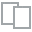
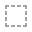
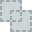
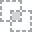
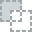
...
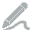
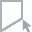
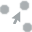
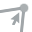
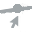

In [10]:
from dataprep.eda import create_report
create_report(data_df)

ValueError: zero-size array to reduction operation maximum which has no identity

In [7]:
print (os.listdir("../ASLTransalation/fingerspelling/data"))
import re 

def get_labels_images(filepath):
    data_dict = {}
    for directory in glob.glob(filepath):
        images = []
        
        for file in glob.glob(directory+'/*.png'):
            images.append(file)
            print(file + " loaded")
        data_dict.setdefault(directory[-1], images)
        print(images.__len__())
    
    print(data_dict.__len__())    
    return data_dict

dataset_dir = os.path.abspath('../ASLTransalation/fingerspelling/data/*')
data_dict = get_labels_images(dataset_dir)


['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y']
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0002.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0003.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0004.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0005.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0006.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0007.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0008.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0009.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0010.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspelling\data\a\00_0_0011.png loaded
c:\Users\Antony\Honours\ASLTransalation\fingerspe

In [192]:
img_sizes_csv = '../ASLHons/image_sizes.csv' 
final_data_dir = '../ASLTransalation/fingerspelling/data/'

img_dict = {'filename':[], 'width':[], 'height':[]}

# Get only relevant files
file_list = [x for x in os.listdir(final_data_dir) if re.search('\*png', x)]
for img_filename in file_list:
    # Open up the image file and get relevant info
    img_path = os.path.join(final_data_dir, img_filename)
    img = Image.open(img_path)
    width, height = img.size
    # Add it to a dictionary before converting to dataframe
    img_dict['filename'].append(img_filename)
    img_dict['width'].append(width)
    img_dict['height'].append(height)
    
# Convert to dataframe and save to CSV    
img_df = pd.DataFrame(data=img_dict)
img_df.to_csv(img_sizes_csv)


display some images

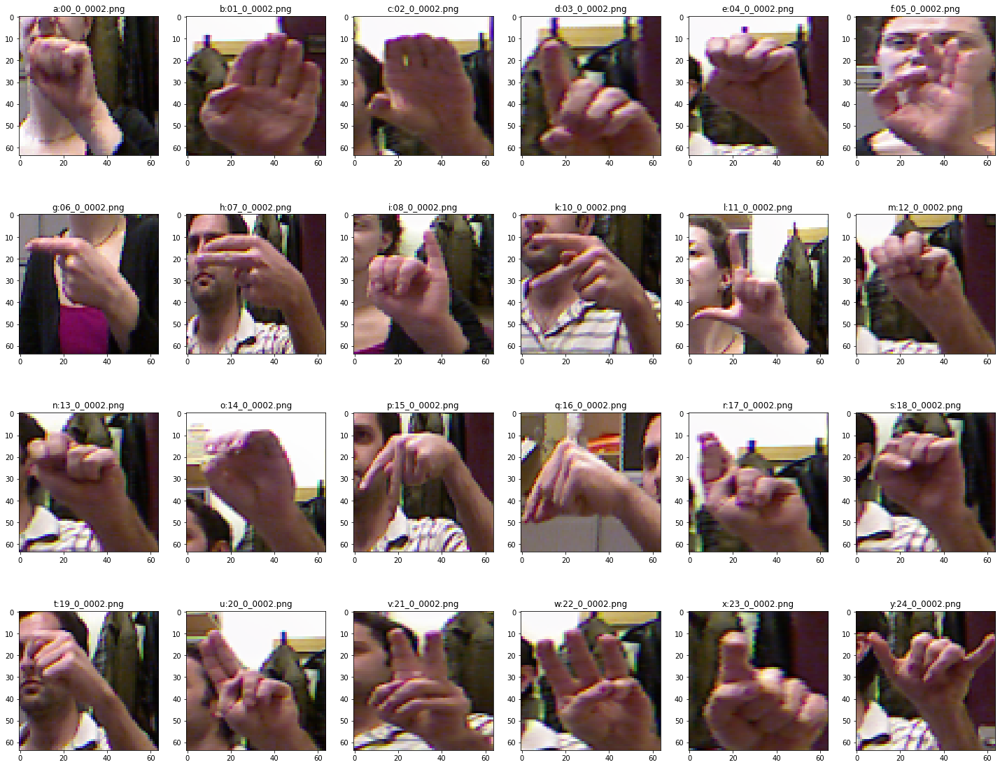

In [12]:
plt.figure(figsize = (25,20))

for i, (k,v) in enumerate(data_dict.items()):
    img = cv2.imread(v[210])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (64,64))
    plt.subplot(4,6,i+1)
    plt.imshow(img)
    plt.title(k + ":" + os.path.basename(v[0]))
    
plt.show()

define preprocessing function

In [13]:
def preprocess_images(dictionary, height = 64, width = 64):
    images = []
    labels = []
    labelsaplh = []
    for k,v in dictionary.items():
        print(k)
        labelsaplh.append(k)
        for file in v:
            
            img = cv2.imread(file)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (height, width))
            img = img / 255.
            images.append(img)
            labels.append(k)
            # print(k)
    
    return (np.array(labelsaplh),np.array(images), np.array(labels).reshape(-1,1))

# print(labels)
labelsaplh, images, labels = preprocess_images(data_dict)

a
b
c
d
e
f
g
h
i
k
l
m
n
o
p
q
r
s
t
u
v
w
x
y


In [14]:
images.shape
labels.shape
print (labelsaplh)

['a' 'b' 'c' 'd' 'e' 'f' 'g' 'h' 'i' 'k' 'l' 'm' 'n' 'o' 'p' 'q' 'r' 's'
 't' 'u' 'v' 'w' 'x' 'y']


# Process the labels to be used in the training process

In [15]:
from sklearn.preprocessing import LabelBinarizer

lbl_binarizer = LabelBinarizer()
labels = lbl_binarizer.fit_transform(labels)

split data

In [17]:
X_train, X_test, Y_train, Y_test = train_test_split(images, labels, test_size = 0.2, random_state = 1)
X_test, X_dev, Y_test, Y_dev = train_test_split(X_test, Y_test, test_size = 0.5, random_state = 1)

print('Number of training samples:{}, Shape: {}'.format(len(X_train), X_train.shape))
print('Number of validation samples:{}, Shape: {}'.format(len(X_dev), X_dev.shape))
print('Number of test samples:{}, Shape: {}'.format(len(X_test), X_test.shape))

Number of training samples:54538, Shape: (54538, 64, 64, 3)
Number of validation samples:6818, Shape: (6818, 64, 64, 3)
Number of test samples:6817, Shape: (6817, 64, 64, 3)


test images

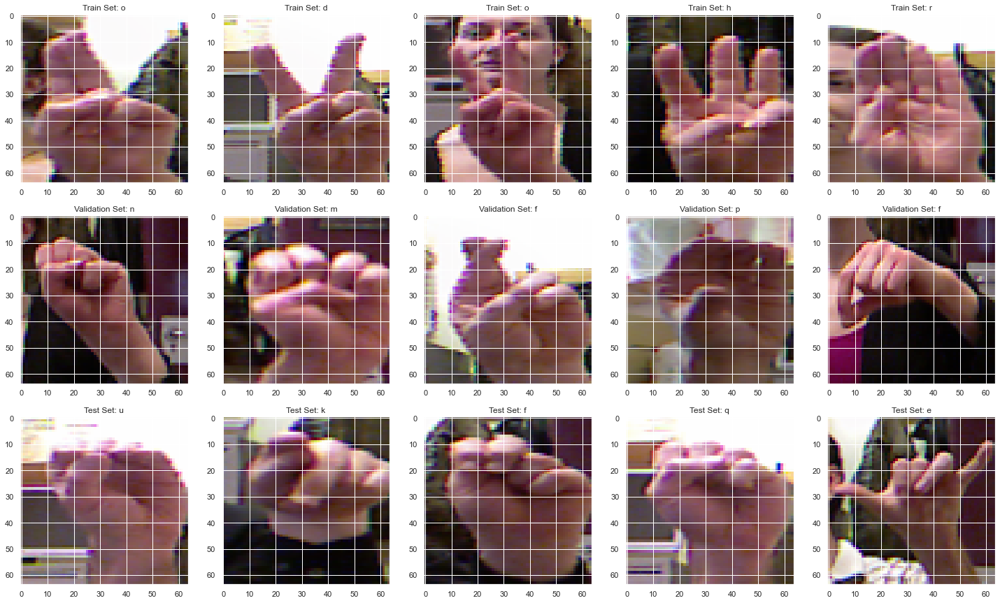

In [47]:
plt.figure(figsize = (25,15))

for i in range(5):
    plt.subplot(3,5,i+1)
    plt.imshow(X_train[300+i])
    plt.title('Train Set: {}'.format(lbl_binarizer.classes_[np.argmax(Y_train[i], axis = -1)]))

for i in range(5,10):
    plt.subplot(3,5,i+1)
    plt.imshow(X_dev[200+i])
    plt.title('Validation Set: {}'.format(lbl_binarizer.classes_[np.argmax(Y_dev[i], axis = -1)]))

for i in range(10,15):
    plt.subplot(3,5,i+1)
    plt.imshow(X_test[100+i])
    plt.title('Test Set: {}'.format(lbl_binarizer.classes_[np.argmax(Y_test[i], axis = -1)]))

plt.show()

In [48]:
from tensorflow.keras.applications.vgg19 import VGG19

img_height = 64
img_width = 64
img_channels = 3
num_classes = labels.shape[1]
learning_rate = 1e-5
weights = '../ASLHons/weights/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5'



def build_model():
    base = VGG19(include_top = False, weights = weights,  input_shape = (img_height, img_width, img_channels))
    X = base.output
    X = tf.keras.layers.Flatten()(X)
    X = tf.keras.layers.Dense(512, activation = 'relu')(X)
    X = tf.keras.layers.Dropout(0.4)(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Dense(512, activation = 'relu')(X)
    X = tf.keras.layers.Dropout(0.3)(X)
    X = tf.keras.layers.BatchNormalization()(X)
    preds = tf.keras.layers.Dense(num_classes, activation = 'softmax')(X)
    
    model = tf.keras.models.Model(inputs = base.input, outputs = preds)
    model.compile(optimizer = tf.keras.optimizers.RMSprop(lr = learning_rate), loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    return model


In [90]:
print(num_classes)

24


summarise model

In [49]:
model = build_model()
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 64, 64, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 64, 64, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 32, 32, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 32, 32, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 32, 32, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 16, 16, 128)       0   

In [74]:
with tf.device('/device:GPU:0'):
    # callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 5, verbose = 1, restore_best_weights = True)]
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = './logs', histogram_freq = 1, write_graph = True, write_images = True)
    history = model.fit(X_train, Y_train,
                        batch_size = 64,
                        workers = 4,
                        verbose = 1,
                        epochs = 20,
                        validation_data = (X_dev, Y_dev), callbacks = tensorboard_callback)


Epoch 1/20
853/853 [==============================] - 31s 36ms/step - loss: 0.0018 - accuracy: 0.9995 - val_loss: 0.0014 - val_accuracy: 0.9994
Epoch 2/20
853/853 [==============================] - 30s 35ms/step - loss: 9.7013e-04 - accuracy: 0.9998 - val_loss: 8.1942e-04 - val_accuracy: 0.9997
Epoch 3/20
853/853 [==============================] - 30s 35ms/step - loss: 0.0010 - accuracy: 0.9998 - val_loss: 6.9214e-04 - val_accuracy: 0.9999
Epoch 4/20
853/853 [==============================] - 30s 35ms/step - loss: 6.0037e-04 - accuracy: 0.9998 - val_loss: 9.5575e-04 - val_accuracy: 0.9996
Epoch 5/20
853/853 [==============================] - 30s 35ms/step - loss: 8.8703e-04 - accuracy: 0.9997 - val_loss: 0.0028 - val_accuracy: 0.9991
Epoch 6/20
853/853 [==============================] - 30s 36ms/step - loss: 4.6037e-04 - accuracy: 0.9999 - val_loss: 0.0015 - val_accuracy: 0.9997
Epoch 7/20
853/853 [==============================] - 30s 36ms/step - loss: 2.9752e-04 - accuracy: 0.9999 - 

In [ ]:
# 

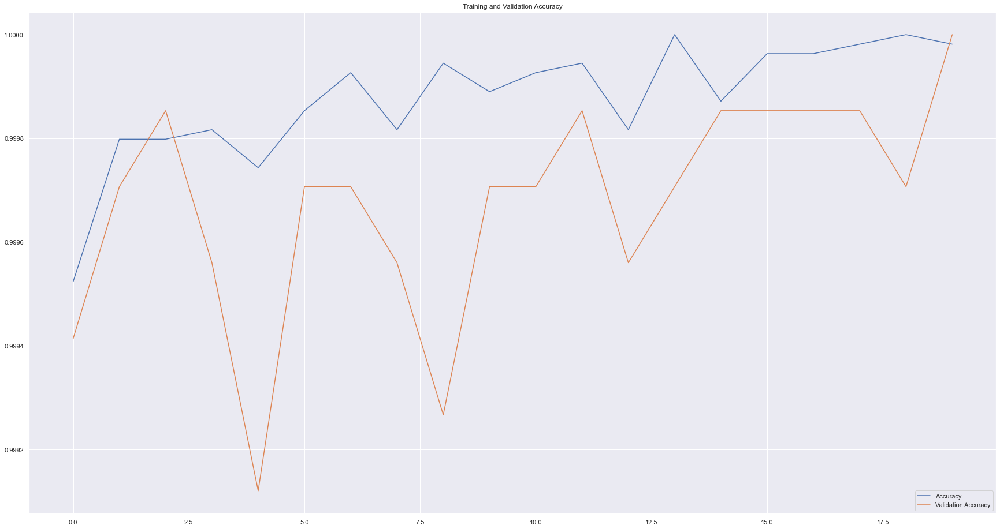

In [75]:
sns.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(30,16)})
sns.lineplot(x=history.epoch, y=history.history['accuracy'], label='Accuracy')
sns.lineplot(x=history.epoch, y=history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend(loc='lower right')

# loss  

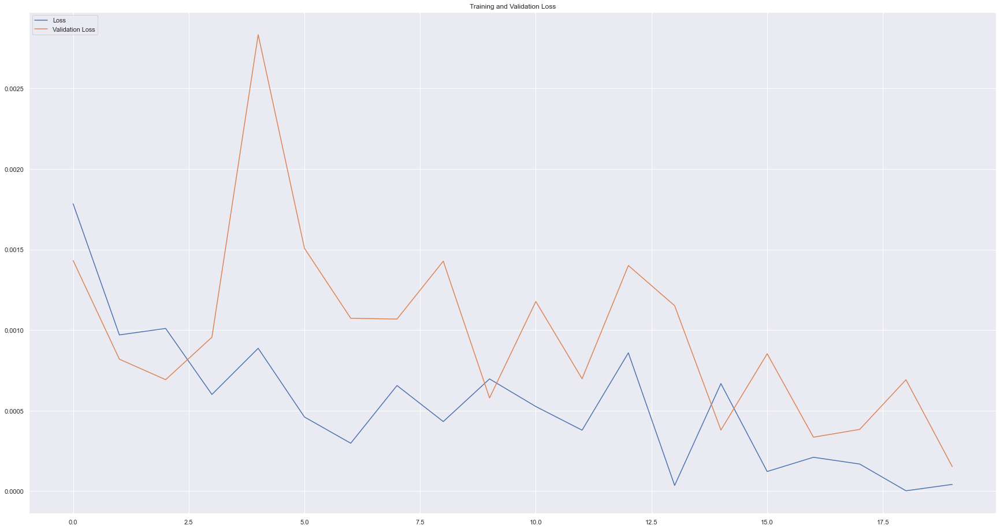

In [76]:
sns.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(30,16)})
sns.lineplot(x=history.epoch, y=history.history['loss'], label='Loss')
sns.lineplot(x=history.epoch, y=history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend(loc='upper left')

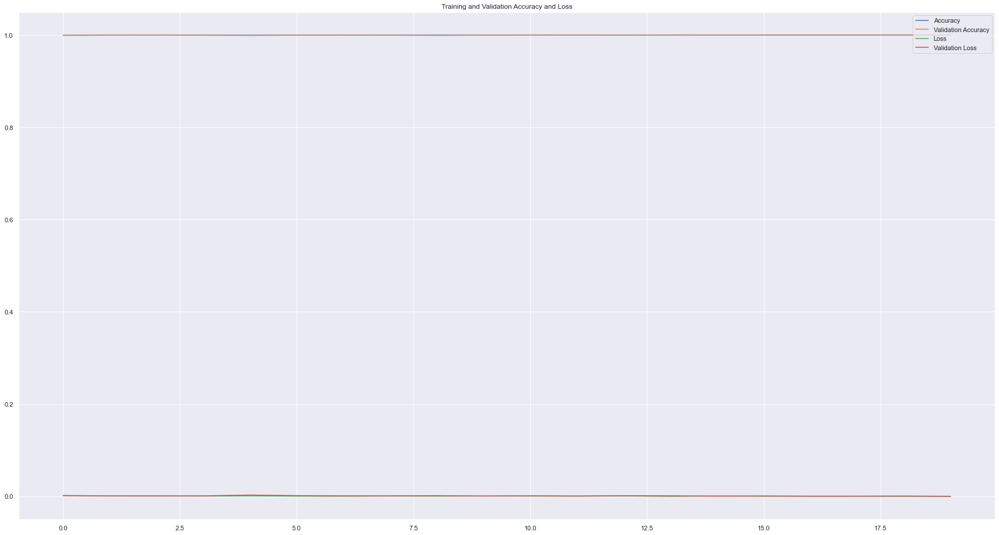

In [77]:
sns.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(30,16)})
sns.lineplot(x=history.epoch, y=history.history['accuracy'], label='Accuracy')
sns.lineplot(x=history.epoch, y=history.history['val_accuracy'], label='Validation Accuracy')
sns.lineplot(x=history.epoch, y=history.history['loss'], label='Loss')
sns.lineplot(x=history.epoch, y=history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Accuracy and Loss')
plt.legend(loc='upper right')

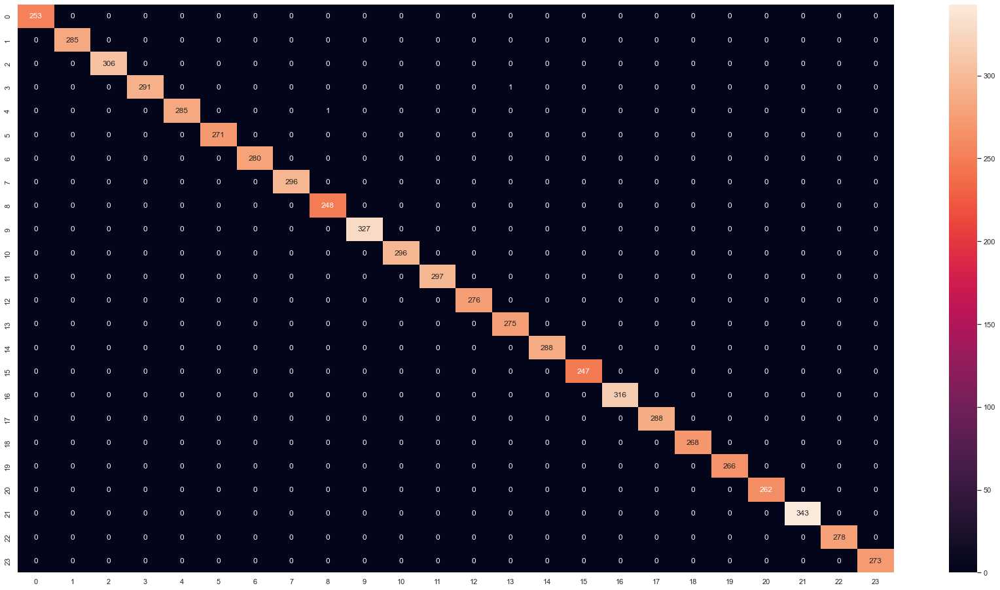

In [78]:
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(Y_test, axis=1)

# Confusion Matrix for Test Data with labelsalph on axis 1
# sns.axisgrid(xlabel='Predicted Label', ylabel='True Label')


sns.heatmap(confusion_matrix(y_true, y_pred_classes),annot=True,fmt="d")
plt.show()

In [79]:
ModelLoss, ModelAccuracy = model.evaluate(X_test, Y_test)

print(f'Test Loss is ',round(ModelLoss,3)*100,'%')
print(f'Test Accuracy is ', round(ModelAccuracy,3)*100,'%')

214/214 [==============================] - 2s 7ms/step - loss: 9.6555e-04 - accuracy: 0.9997
Test Loss is  0.1 %
Test Accuracy is  100.0 %


In [80]:
best_model_accuracy = history.history['accuracy'][np.argmin(history.history['loss'])]*100
print ("Best Model Accuracy:", round(best_model_accuracy, 3), "%")

Best Model Accuracy: 100.0 %


In [81]:
model_path = 'trained_models'
if not os.path.isdir(model_path): os.mkdir(model_path)

model.save('trained_models/my_model.h5')

In [82]:
from datetime import datetime

In [83]:
import tensorboard
tensorboard.__version__

'2.6.0'

In [84]:
# Define the Keras TensorBoard callback.
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [89]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
